# Video Game Data Analysis

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
video_games=pd.read_csv('vgsales.csv')

In [3]:
video_games.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [4]:
video_games.shape

(16598, 11)

### isnull is used to find null values in the dataset

In [5]:
video_games.isnull().sum()

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64

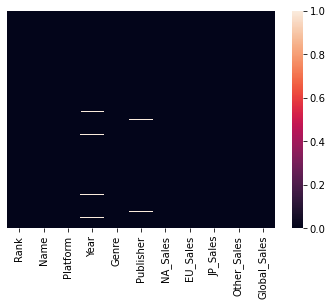

In [6]:
sns.heatmap(video_games.isnull(),yticklabels=False)

In [7]:
video_games.columns

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')

In [8]:
video_games.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16598.000000,16327.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,2006.406443,0.264667,0.146652,0.077782,0.048063,0.537441
std,4791.853933,5.828981,0.816683,0.505351,0.309291,0.188588,1.555028
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4151.250000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8300.500000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12449.750000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.470000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


In [9]:
video_games.corr()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Rank,1.000000,0.178814,-0.401362,-0.379123,-0.267785,-0.332986,-0.427407
Year,0.178814,1.000000,-0.091402,0.006014,-0.169316,0.041058,-0.074735
NA_Sales,-0.401362,-0.091402,1.000000,0.767727,0.449787,0.634737,0.941047
EU_Sales,-0.379123,0.006014,0.767727,1.000000,0.435584,0.726385,0.902836
JP_Sales,-0.267785,-0.169316,0.449787,0.435584,1.000000,0.290186,0.611816
Other_Sales,-0.332986,0.041058,0.634737,0.726385,0.290186,1.000000,0.748331
Global_Sales,-0.427407,-0.074735,0.941047,0.902836,0.611816,0.748331,1.000000


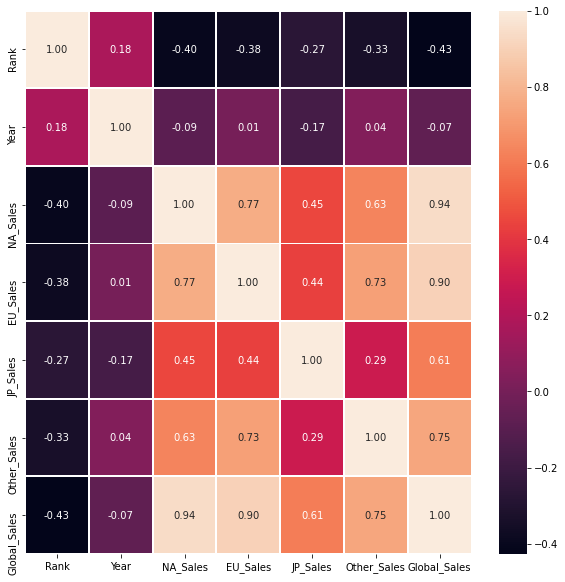

In [10]:
f,ax = plt.subplots(figsize=(10,10))
sns.heatmap(video_games.corr(), annot= True, linewidth= 1, fmt= '.2f', ax=ax)

### Action or sports genre. Which genre has most number of sales 

In [11]:
genre_count= video_games.Genre.value_counts()
genre_count

Action          3316
Sports          2346
Misc            1739
Role-Playing    1488
Shooter         1310
Adventure       1286
Racing          1249
Platform         886
Simulation       867
Fighting         848
Strategy         681
Puzzle           582
Name: Genre, dtype: int64

### Data Preparing

In [12]:
video_games['Platform'].unique()

array(['Wii', 'NES', 'GB', 'DS', 'X360', 'PS3', 'PS2', 'SNES', 'GBA',
       '3DS', 'PS4', 'N64', 'PS', 'XB', 'PC', '2600', 'PSP', 'XOne', 'GC',
       'WiiU', 'GEN', 'DC', 'PSV', 'SAT', 'SCD', 'WS', 'NG', 'TG16',
       '3DO', 'GG', 'PCFX'], dtype=object)

In [13]:
video_games['Year'].unique()

array([2006., 1985., 2008., 2009., 1996., 1989., 1984., 2005., 1999.,
       2007., 2010., 2013., 2004., 1990., 1988., 2002., 2001., 2011.,
       1998., 2015., 2012., 2014., 1992., 1997., 1993., 1994., 1982.,
       2003., 1986., 2000.,   nan, 1995., 2016., 1991., 1981., 1987.,
       1980., 1983., 2020., 2017.])

In [14]:
video_games.loc[1]

Rank                            2
Name            Super Mario Bros.
Platform                      NES
Year                         1985
Genre                    Platform
Publisher                Nintendo
NA_Sales                    29.08
EU_Sales                     3.58
JP_Sales                     6.81
Other_Sales                  0.77
Global_Sales                40.24
Name: 1, dtype: object

### I have created two duplicate database one for data exploration another one for model prepration

In [15]:
video_games1=video_games.copy()

In [16]:
video_games2=video_games.copy()

### Lets fill suitable value for missing fields

In [17]:
video_games2[['Year', 'Publisher']].describe(include='all')

,Year,Publisher
count,16327.000000,16540
unique,NaN,578
top,NaN,Electronic Arts
freq,NaN,1351
mean,2006.406443,NaN
std,5.828981,NaN
min,1980.000000,NaN
25%,2003.000000,NaN
50%,2007.000000,NaN
75%,2010.000000,NaN


### Filling missing value in year feature with its mean

In [18]:
video_games2['Year'] = video_games2['Year'].fillna(video_games2['Year'].mean())

In [19]:
video_games2 = video_games2.dropna(axis=0)
video_games2.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [20]:
video_games2.isnull().sum()

Rank            0
Name            0
Platform        0
Year            0
Genre           0
Publisher       0
NA_Sales        0
EU_Sales        0
JP_Sales        0
Other_Sales     0
Global_Sales    0
dtype: int64

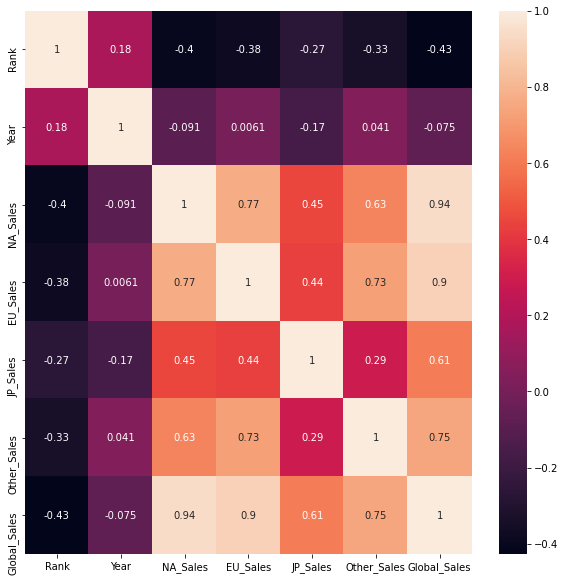

In [21]:
import seaborn as sns
plt.figure(figsize=(10,10))
sns.heatmap(video_games2.corr(), annot=True)
plt.show()

In [22]:
pd.set_option('display.max_rows', video_games2.shape[0]+1)
top_genre_games =video_games2.groupby('Genre').head(1)
top_genre_games

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
5,6,Tetris,GB,1989.0,Puzzle,Nintendo,23.20,2.26,4.22,0.58,30.26
7,8,Wii Play,Wii,2006.0,Misc,Nintendo,14.03,9.20,2.93,2.85,29.02
9,10,Duck Hunt,NES,1984.0,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31
10,11,Nintendogs,DS,2005.0,Simulation,Nintendo,9.07,11.00,1.93,2.75,24.76
16,17,Grand Theft Auto V,PS3,2013.0,Action,Take-Two Interactive,7.01,9.27,0.97,4.14,21.40
39,40,Super Smash Bros. Brawl,Wii,2008.0,Fighting,Nintendo,6.75,2.61,2.66,1.02,13.04


In [23]:
video_games2.Publisher.unique()

array(['Nintendo', 'Microsoft Game Studios', 'Take-Two Interactive',
       'Sony Computer Entertainment', 'Activision', 'Ubisoft',
       'Bethesda Softworks', 'Electronic Arts', 'Sega', 'SquareSoft',
       'Atari', '505 Games', 'Capcom', 'GT Interactive',
       'Konami Digital Entertainment',
       'Sony Computer Entertainment Europe', 'Square Enix', 'LucasArts',
       'Virgin Interactive', 'Warner Bros. Interactive Entertainment',
       'Universal Interactive', 'Eidos Interactive', 'RedOctane',
       'Vivendi Games', 'Enix Corporation', 'Namco Bandai Games',
       'Palcom', 'Hasbro Interactive', 'THQ', 'Fox Interactive',
       'Acclaim Entertainment', 'MTV Games', 'Disney Interactive Studios',
       'Majesco Entertainment', 'Codemasters', 'Red Orb', 'Level 5',
       'Arena Entertainment', 'Midway Games', 'JVC', 'Deep Silver',
       '989 Studios', 'NCSoft', 'UEP Systems', 'Parker Bros.', 'Maxis',
       'Imagic', 'Tecmo Koei', 'Valve Software', 'ASCII Entertainment',
     

## Publisher's Global sales

In [24]:
def plot_scatter_plot(df,Publisher):
    data_1=df[(df.Publisher==Publisher)&(df.Global_Sales<=20)]
    data_2=df[(df.Publisher==Publisher)&(df.Global_Sales>=20)]
    plt.scatter(data_1.Global_Sales,data_1.Year,color='blue',label='data_1',s=50)
    plt.scatter(data_2.Global_Sales,data_2.Year,color='green',label='data_2',marker='+',s=50)
    plt.xlabel('Global_Sales')
    plt.ylabel('Year')
    plt.title('Publisher --Year')

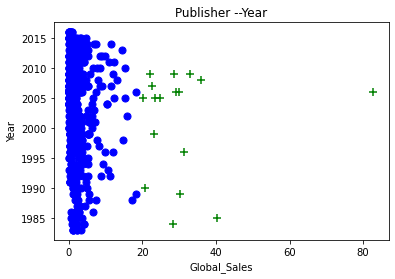

In [25]:
#you can find any Publisher global sales by placing publisher name next to "video_games2"
plot_scatter_plot(video_games2,'Nintendo')

### Platform wise top_games

In [26]:
top_games= video_games2.groupby(by=['Platform']).apply(lambda x : x.sort_values('Global_Sales', ascending=False).head(1))
top_games

,,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Platform,,,,,,,,,,,,
2600,89,90,Pac-Man,2600,1982.0,Puzzle,Atari,7.28,0.45,0.00,0.08,7.81
3DO,12635,12637,Policenauts,3DO,1995.0,Adventure,Konami Digital Entertainment,0.00,0.00,0.06,0.00,0.06
3DS,32,33,Pokemon X/Pokemon Y,3DS,2013.0,Role-Playing,Nintendo,5.17,4.05,4.34,0.79,14.35
DC,637,638,Sonic Adventure,DC,1998.0,Platform,Sega,1.26,0.61,0.46,0.08,2.42
DS,6,7,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01
GB,4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
GBA,25,26,Pokemon Ruby/Pokemon Sapphire,GBA,2002.0,Role-Playing,Nintendo,6.06,3.90,5.38,0.50,15.85
GC,107,108,Super Smash Bros. Melee,GC,2001.0,Fighting,Nintendo,4.41,1.04,1.39,0.22,7.07
GEN,143,144,Sonic the Hedgehog 2,GEN,1992.0,Platform,Sega,4.47,1.20,0.16,0.19,6.03


##### Let's explore more regional sales for respective aspects ['Platform', 'Genre', 'Publisher']

In [27]:
regionals = ['NA_Sales', 'EU_Sales', 'JP_Sales']
aspects = ['Platform', 'Genre', 'Publisher']
for i in regionals:
    for j in aspects:
        k = video_games2.groupby(j)[i].sum().sort_values(ascending=False).head(1)
        display(k)

Platform
X360    601.04
Name: NA_Sales, dtype: float64

Genre
Action    877.54
Name: NA_Sales, dtype: float64

Publisher
Nintendo    816.87
Name: NA_Sales, dtype: float64

Platform
PS3    343.23
Name: EU_Sales, dtype: float64

Genre
Action    524.92
Name: EU_Sales, dtype: float64

Publisher
Nintendo    418.74
Name: EU_Sales, dtype: float64

Platform
DS    175.34
Name: JP_Sales, dtype: float64

Genre
Role-Playing    352.26
Name: JP_Sales, dtype: float64

Publisher
Nintendo    455.42
Name: JP_Sales, dtype: float64

### Each regionals top 3 sales by thier respective game,genre or pulisher

In [28]:
for i in regionals:
    display(video_games2.sort_values(by=[i], ascending=False).head(3))

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
9,10,Duck Hunt,NES,1984.0,Shooter,Nintendo,26.93,0.63,0.28,0.47,28.31


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00


,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
12,13,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,Nintendo,9.00,6.18,7.20,0.71,23.10
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24


### Visualizing the distribution of Global sales across year's

Text(0, 0.5, 'Global Sales')

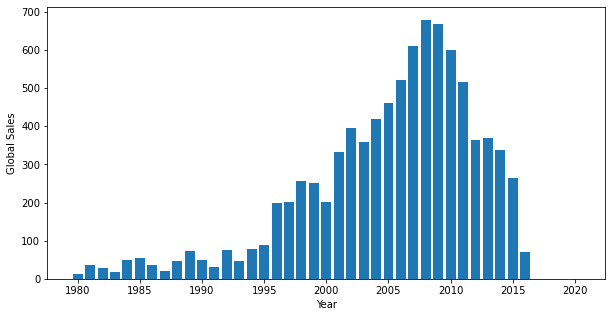

In [29]:
sales_by_year= video_games1.groupby('Year')['Global_Sales'].sum()
plt.figure(figsize=(10,5))
plt.bar(sales_by_year.index,sales_by_year)
plt.xlabel('Year')
plt.ylabel('Global Sales')

In [30]:
video_games2['Name'].value_counts().head(5)

Need for Speed: Most Wanted    12
LEGO Marvel Super Heroes        9
Madden NFL 07                   9
FIFA 14                         9
Ratatouille                     9
Name: Name, dtype: int64

### Univariate Data Analysis


### Genre

In [31]:
video_games2['Genre'].value_counts()/video_games2.shape[0]*100

Action          20.006046
Sports          14.165659
Misc            10.350665
Role-Playing     8.984281
Shooter          7.908102
Adventure        7.750907
Racing           7.545345
Platform         5.344619
Simulation       5.217654
Fighting         5.114873
Strategy         4.099154
Puzzle           3.512696
Name: Genre, dtype: float64

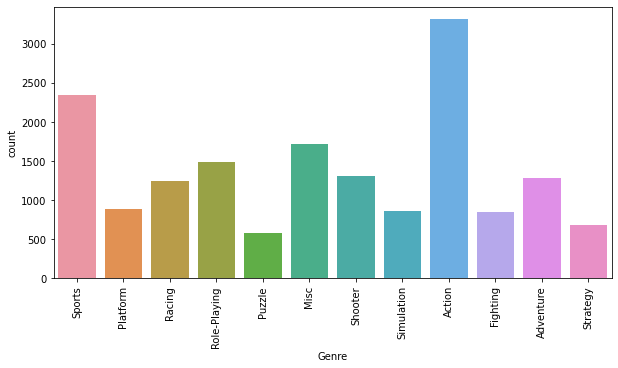

In [32]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=90)
sns.countplot(video_games2['Genre'])

### Year

In [33]:
video_games2['Year'].value_counts()/video_games2.shape[0]*100

2009.000000    8.651753
2008.000000    8.633615
2010.000000    7.599758
2007.000000    7.261185
2011.000000    6.868198
2006.000000    6.094317
2005.000000    5.659008
2002.000000    5.012092
2003.000000    4.685611
2004.000000    4.498186
2012.000000    3.960097
2015.000000    3.712213
2014.000000    3.506651
2013.000000    3.301088
2001.000000    2.914148
1998.000000    2.291415
2000.000000    2.110036
2016.000000    2.067715
1999.000000    2.043531
1997.000000    1.747279
1996.000000    1.590085
2006.406443    1.505441
1995.000000    1.324063
1994.000000    0.731560
1993.000000    0.362757
1981.000000    0.278114
1992.000000    0.259976
1991.000000    0.247884
1982.000000    0.217654
1986.000000    0.126965
1989.000000    0.102781
1983.000000    0.102781
1990.000000    0.096735
1987.000000    0.096735
1988.000000    0.090689
1985.000000    0.084643
1984.000000    0.084643
1980.000000    0.054414
2017.000000    0.018138
2020.000000    0.006046
Name: Year, dtype: float64

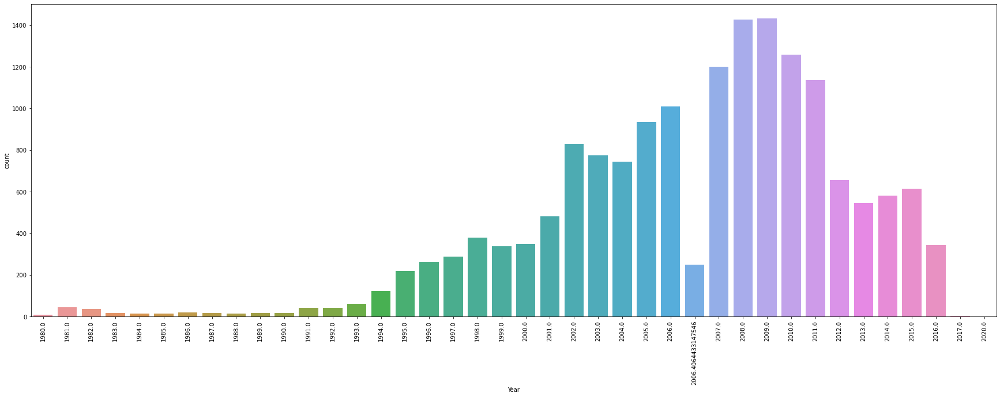

In [34]:
plt.figure(figsize=(30,10))
plt.xticks(rotation=90)
sns.countplot(video_games2['Year'])

### Platform

In [35]:
video_games2['Platform'].value_counts()/video_games2.shape[0]*100

PS2     13.053204
DS      13.035067
PS3      8.016929
Wii      8.004837
X360     7.623942
PSP      7.321644
PS       7.212817
PC       5.767836
XB       4.981862
GBA      4.812576
GC       3.361548
3DS      3.065296
PSV      2.484885
PS4      2.031439
N64      1.928658
SNES     1.444982
XOne     1.287787
SAT      1.045949
WiiU     0.864571
2600     0.804111
NES      0.592503
GB       0.592503
DC       0.314389
GEN      0.163241
NG       0.072551
WS       0.036276
SCD      0.036276
3DO      0.018138
TG16     0.012092
PCFX     0.006046
GG       0.006046
Name: Platform, dtype: float64

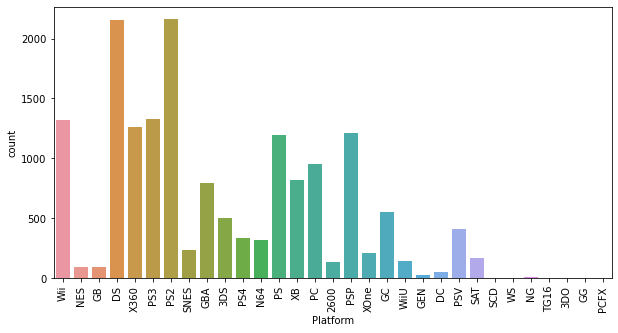

In [36]:
plt.figure(figsize=(10,5))
plt.xticks(rotation=90)
sns.countplot(video_games2['Platform'])

## Bivarient Analysis

### Year wise Global sales

Text(0, 0.5, 'year')

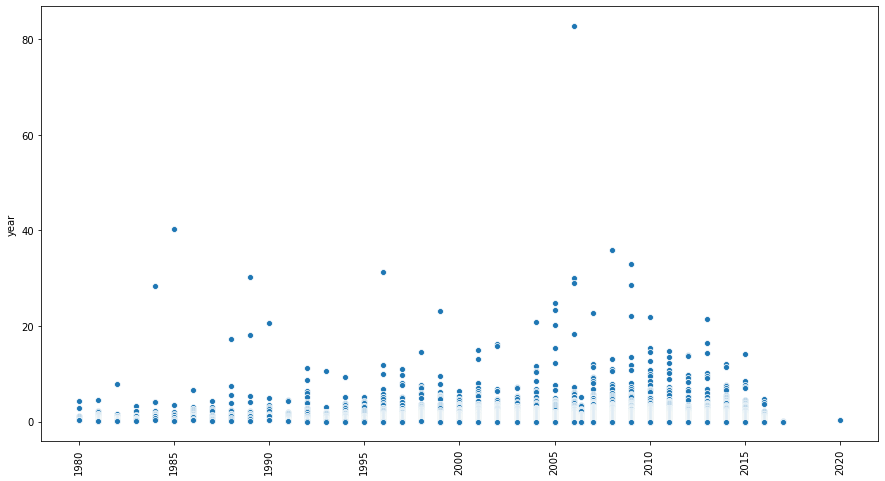

In [37]:
plt.figure(figsize=(15,8))
sns.scatterplot(y=video_games2['Global_Sales'], x=video_games2['Year'])
plt.xticks(rotation=90)
plt.xlabel(None)
plt.ylabel('year')

In [38]:
video_games2['Global_Sales'].describe()

count    16540.000000
mean         0.538426
std          1.557424
min          0.010000
25%          0.060000
50%          0.170000
75%          0.480000
max         82.740000
Name: Global_Sales, dtype: float64

In [39]:
Top_global_sales=video_games1.loc[video_games1['Global_Sales']==82.74]
Top_global_sales

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74


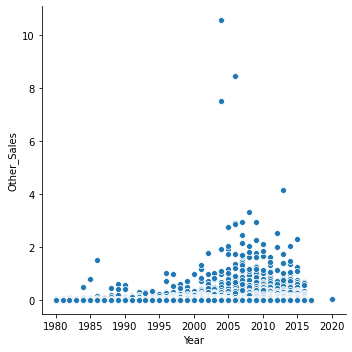

In [40]:
sns.relplot(data=video_games2, x="Year", y="Other_Sales")

In [41]:
video_games2['Other_Sales'].describe()

count    16540.000000
mean         0.048191
std          0.188879
min          0.000000
25%          0.000000
50%          0.010000
75%          0.040000
max         10.570000
Name: Other_Sales, dtype: float64

In [42]:
Top_other_sales=video_games2.loc[video_games2['Other_Sales']==10.57]
Top_other_sales

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
17,18,Grand Theft Auto: San Andreas,PS2,2004.0,Action,Take-Two Interactive,9.43,0.4,0.41,10.57,20.81


# Model prepration

###  One hot encoding

In [43]:
onehot_columns = ['Platform', 'Genre', 'Publisher']

In [44]:
def onehot_encode(video_games2, columns):
    for column in columns:
        dummies = pd.get_dummies(video_games2[column])
        video_games2 = pd.concat([video_games2, dummies], axis=1)
        video_games2.drop(column, axis=1, inplace=True)
    return video_games2

In [45]:
video_games1 = onehot_encode(video_games2, onehot_columns)

In [46]:
video_games1.head()

,Rank,Name,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,2600,3DO,...,Zushi Games,bitComposer Games,dramatic create,fonfun,iWin,id Software,imageepoch Inc.,inXile Entertainment,"mixi, Inc",responDESIGN
0,1,Wii Sports,2006.0,41.49,29.02,3.77,8.46,82.74,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,Super Mario Bros.,1985.0,29.08,3.58,6.81,0.77,40.24,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,Mario Kart Wii,2008.0,15.85,12.88,3.79,3.31,35.82,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,Wii Sports Resort,2009.0,15.75,11.01,3.28,2.96,33.00,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Pokemon Red/Pokemon Blue,1996.0,11.27,8.89,10.22,1.00,31.37,0,0,...,0,0,0,0,0,0,0,0,0,0


In [84]:
x = video_games1.drop('Global_Sales', axis=1)

In [59]:
x

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,2600,3DO,3DS,DC,...,Zushi Games,bitComposer Games,dramatic create,fonfun,iWin,id Software,imageepoch Inc.,inXile Entertainment,"mixi, Inc",responDESIGN
0,1,2006.000000,41.49,29.02,3.77,8.46,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,1985.000000,29.08,3.58,6.81,0.77,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,2008.000000,15.85,12.88,3.79,3.31,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,2009.000000,15.75,11.01,3.28,2.96,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,1996.000000,11.27,8.89,10.22,1.00,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,1989.000000,23.20,2.26,4.22,0.58,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,7,2006.000000,11.38,9.23,6.50,2.90,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,8,2006.000000,14.03,9.20,2.93,2.85,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,9,2009.000000,14.59,7.06,4.70,2.26,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,10,1984.000000,26.93,0.63,0.28,0.47,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [48]:
y = video_games1['Global_Sales']
y

0        82.74
1        40.24
2        35.82
3        33.00
4        31.37
5        30.26
6        30.01
7        29.02
8        28.62
9        28.31
10       24.76
11       23.42
12       23.10
13       22.72
14       22.00
15       21.82
16       21.40
17       20.81
18       20.61
19       20.22
20       18.36
21       18.14
22       17.28
23       16.38
24       16.15
25       15.85
26       15.32
27       15.30
28       14.98
29       14.76
30       14.64
31       14.64
32       14.35
33       14.24
34       14.03
35       13.73
36       13.51
37       13.46
38       13.10
39       13.04
40       12.73
41       12.27
42       12.21
43       12.14
44       11.98
45       11.90
46       11.89
47       11.66
48       11.52
49       11.33
50       11.18
51       11.02
52       10.95
53       10.79
54       10.77
55       10.69
56       10.57
57       10.55
58       10.49
59       10.42
60       10.26
61       10.21
62        9.88
63        9.87
64        9.82
65        9.76
66        

In [76]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,random_state=42)

In [77]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()

lr.fit(x_train, y_train)

LinearRegression()

In [78]:
print(lr.intercept_)

0.04058725518015249


In [79]:
print(lr.coef_)

[ 9.50681883e-08 -2.06162580e-05  9.99900186e-01  1.00006200e+00
  1.00037763e+00  9.99837494e-01 -4.04708635e-06 -6.02503534e-04
 -2.81129641e-04  3.62799035e-04  7.34491639e-05 -3.76728279e-04
  5.57554449e-04  3.13102282e-04  3.11999841e-04 -7.66007024e-04
  4.78769354e-04 -6.76933835e-05 -8.51162555e-05  3.95914021e-04
  1.69309011e-15 -2.05840568e-04 -6.92329277e-05  1.13951030e-04
 -1.95531298e-04 -5.33292908e-05 -2.37042182e-04 -2.20209389e-04
 -3.30394170e-04 -1.63138624e-04 -4.11906016e-04 -9.50259816e-05
  2.05087430e-04  5.18432059e-04  4.71955151e-04  3.95374919e-04
 -3.35130854e-05  1.32213199e-04 -1.78171946e-04 -1.80645551e-04
  1.69445161e-04 -5.18429030e-06  2.06162067e-04 -2.31514923e-04
  8.40887667e-05  6.67798300e-05  5.11288889e-05  7.77940897e-06
 -1.22080611e-04 -5.47359123e-04 -9.05688945e-04  1.66371042e-03
  1.60704783e-14 -4.69480901e-04  4.84334794e-14  3.00595502e-04
 -4.66576074e-04  5.82818509e-03 -8.76382300e-15  2.58844457e-03
 -7.65157600e-03  3.00264

In [80]:
coeff_df = pd.DataFrame(lr.coef_,index=x.columns,columns=['Coefficients'])
coeff_df

,Coefficients
Rank,9.506819e-08
Year,-2.061626e-05
NA_Sales,9.999002e-01
EU_Sales,1.000062e+00
JP_Sales,1.000378e+00
Other_Sales,9.998375e-01
2600,-4.047086e-06
3DO,-6.025035e-04
3DS,-2.811296e-04
DC,3.627990e-04


In [81]:
y_pred = lr.predict(x_test)

In [82]:
y_pred

array([0.50838364, 1.72939283, 0.07104093, ..., 0.31890658, 0.39068934,
       0.59019968])

In [83]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

print(f'Mean Absolute Error : {mean_absolute_error(y_pred,y_test)}')
print(f'Mean Squared Error : {mean_squared_error(y_pred,y_test)}')
print(f'Root Mean Squared Error : {np.sqrt(mean_squared_error(y_pred,y_test))}')
print(f'R-squared : {r2_score(y_test,y_pred)}')

Mean Absolute Error : 0.0031177283359418314
Mean Squared Error : 2.726458727465391e-05
Root Mean Squared Error : 0.005221550275028855
R-squared : 0.9999935347943045
